<a href="https://colab.research.google.com/github/Ndxxxu-Ndichu/AI-Machine_Learining/blob/main/nukta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu116

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu116


In [2]:
!git clone https://github.com/facebookresearch/detectron2.git

Cloning into 'detectron2'...
remote: Enumerating objects: 14778, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 14778 (delta 17), reused 37 (delta 11), pack-reused 14721
Receiving objects: 100% (14778/14778), 6.04 MiB | 19.70 MiB/s, done.
Resolving deltas: 100% (10688/10688), done.


In [3]:
import os


In [4]:
cd /


/


In [5]:
os.chdir('content/detectron2')

In [6]:
!pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 KB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 58.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 16.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 12.4 MB/s eta 0:00:00
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61431 sha256=073da6e6a331c11fae6abe65389a9ed31d7c06643ab5db8e189135bb12ae3150
  Stored in directory: /root/.cache/pip/wheels/b8/79/07/c0e9367f5b5ea325e246bd73651e8af175fabbe

In [36]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
from detectron2.config import get_cfg
from detectron2 import model_zoo

from detectron2.utils.visualizer import ColorMode

import random
from google.colab.patches import cv2_imshow
import cv2
import matplotlib.pyplot as plt

def plot_samples(dataset_name, n=1):
    dataset_custom = DatasetCatalog.get(dataset_name)
    dataset_custom_metadata = MetadataCatalog.get(dataset_name)

    for s in random.sample(dataset_custom, n):
        img = cv2.imread(s['file_name'])
        v = Visualizer(img[:,:,::-1], metadata=dataset_custom_metadata, scale=0.5)
        v = v.draw_dataset_dict(s)
        plt.figure(figsize=(15, 20))
        plt.imshow(v.get_image())
        plt.show()

def get_train_cfg(config_file_path, checkpoint_url, train_dataset_name, test_dataset_name, num_classes, device, output_dir):        
   cfg = get_cfg()

   cfg.merge_from_file(model_zoo.get_config_file(config_file_path))
   cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(checkpoint_url)
   cfg.DATASETS.TRAIN = (train_dataset_name,)
   cfg.DATASETS.TEST = (test_dataset_name,)


   cfg.DATALOADER.NUM_WORKERS = 2

   cfg.SOLVER.IMS_PER_BATCH = 2
   cfg.SOLVER.BASE_LR = 0.00025
   cfg.SOLVER.MAX_ITER = 1000
   cfg.SOLVER.STEPS = []

   cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes
   cfg.MODEL.DEV = device

   cfg.OUTPUT_DIR = output_dir

   return cfg

def on_image(image_path, predictor):
  im = cv2.imread(image_path)
  outputs = predictor(im)
  v = Visualizer(im[:,:,::-1], metadata={}, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
  v = v.draw_instance_predictions(outputs['instances'].to("cpu"))

  plt.figure(figsize=(14, 10))
  plt.imshow(v.get_image())
  plt.show()

def on_video(videoPath, predictor): 
  cap = cv2.VideoCapture(videoPath)
  if (cap.isOpened() == False):
    print('Error opening file')
    return

  (success, image) = cap.read()
  while success:
    predictions = predictor(image)
    v = Visualizer(image[:,:,::-1], metadata={}, instance_mode=ColorMode.SEGMENTATION)
    output = v.draw_instance_predictions(predictions["instances"].to('cpu'))

    cv2_imshow(output.get_image()[:,:,::-1])

    key = cv2.waitKey(1) & 0xFF
    if key == ord("q"):
      break
    (success, image) = cap.read()  


In [21]:
cd /


/


In [23]:
from detectron2.utils.logger import setup_logger

setup_logger()

from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer

import os
import pickle


config_file_path = 'COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml'
checkpoint_url = 'COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml'

output_dir = "/content/detectron2/output/object_detection"
num_classes = 1

device = "cpu"

train_dataset_name = "HP_train"
train_images_path = "/content/train"
train_json_annot_path = "/content/train.json"

test_dataset_name = "HP_test"
test_images_path = "/content/test"
test_json_annot_path = "/content/test.json"

cfg_save_path = '/content/OD_cfg.pickle'

##########################################################################

register_coco_instances(name=train_dataset_name, metadata={}, json_file=train_json_annot_path, image_root=train_images_path)


register_coco_instances(name=test_dataset_name, metadata={}, json_file=test_json_annot_path, image_root=test_images_path)

#plot_samples(dataset_name=train_dataset_name, n=3)

###########################################################################

def main():
    cfg = get_train_cfg(config_file_path, checkpoint_url, train_dataset_name, test_dataset_name, num_classes, device, output_dir)

    with open(cfg_save_path, 'wb') as f:
        pickle.dump(cfg, f, protocol=pickle.HIGHEST_PROTOCOL)

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)

    trainer.train()

if __name__ == '__main__':
    main()        



[01/23 14:01:51 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[01/23 14:01:51 d2.engine.train_loop]: Starting training from iteration 0
[01/23 14:02:02 d2.utils.events]:  eta: 0:08:36  iter: 19  total_loss: 0.9329  loss_cls: 0.7452  loss_box_reg: 0.07878  loss_rpn_cls: 0.07321  loss_rpn_loc: 0.006598  time: 0.5159  data_time: 0.0230  lr: 4.9953e-06  max_mem: 3060M
[01/23 14:02:13 d2.utils.events]:  eta: 0:08:28  iter: 39  total_loss: 0.8536  loss_cls: 0.6801  loss_box_reg: 0.08405  loss_rpn_cls: 0.08489  loss_rpn_loc: 0.006156  time: 0.5225  data_time: 0.0133  lr: 9.9902e-06  max_mem: 3060M
[01/23 14:02:23 d2.utils.events]:  eta: 0:08:20  iter: 59  total_loss: 0.7352  loss_cls: 0.5716  loss_box_reg: 0.09086  loss_rpn_cls: 0.07276  loss_rpn_loc: 0.00645  time: 0.5271  data_time: 0.0119  lr: 1.4985e-05  max_mem: 3060M
[01/23 14:02:34 d2.utils.events]:  eta: 0:08:07  iter: 79  total_loss: 0.6088  loss_cls: 0.4289  loss_box_reg: 0.08869  loss_rpn_cls: 0.07132  loss_rpn_loc: 0.005863  time: 0.5237  data_time: 0.0119  lr: 1.998e-05  max_mem: 3060M
[01/

[01/23 14:45:11 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/detectron2/output/object_detection/model_final.pth ...


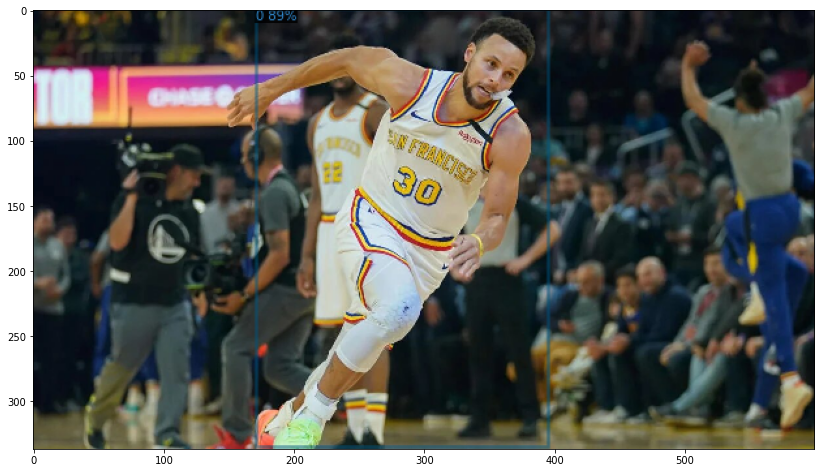

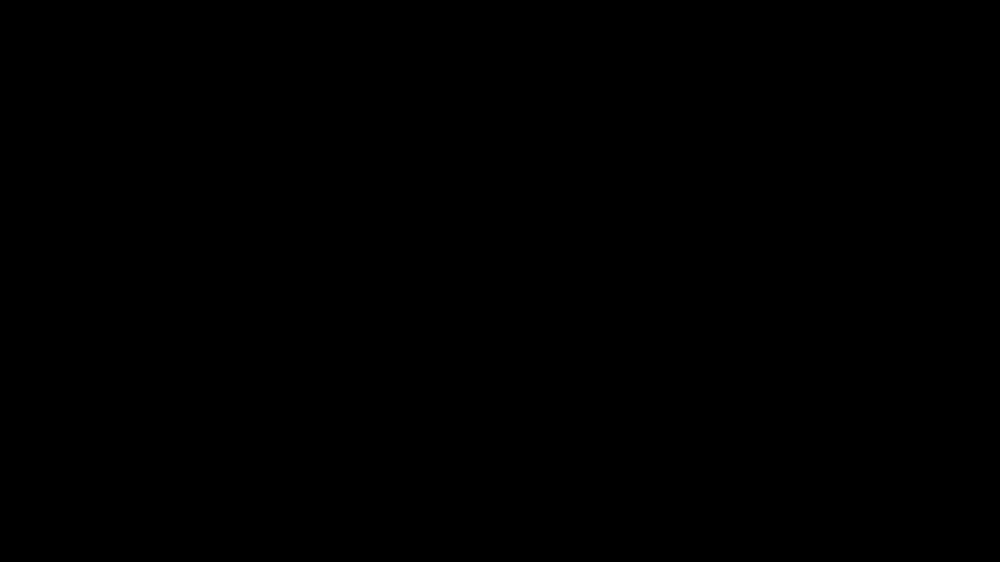

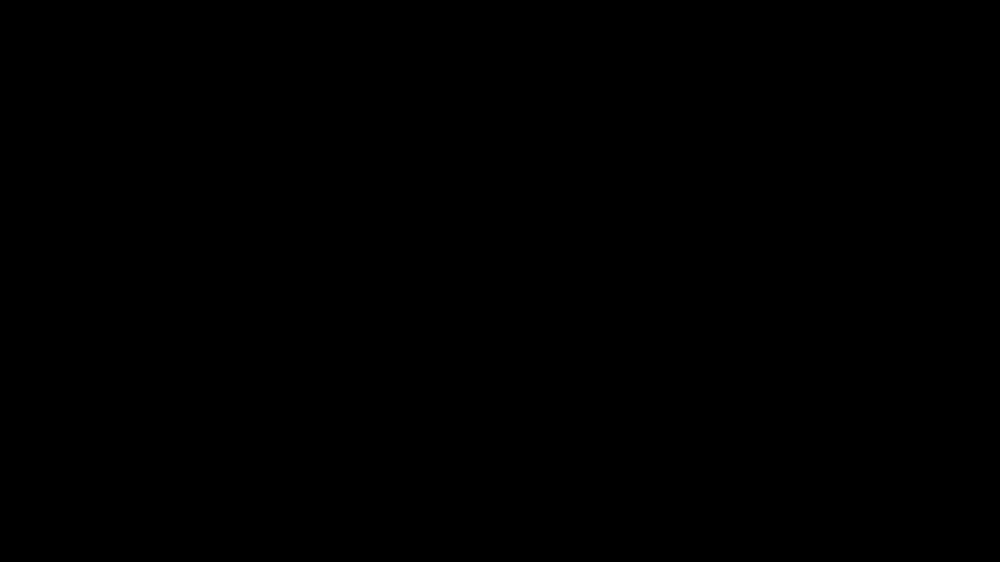

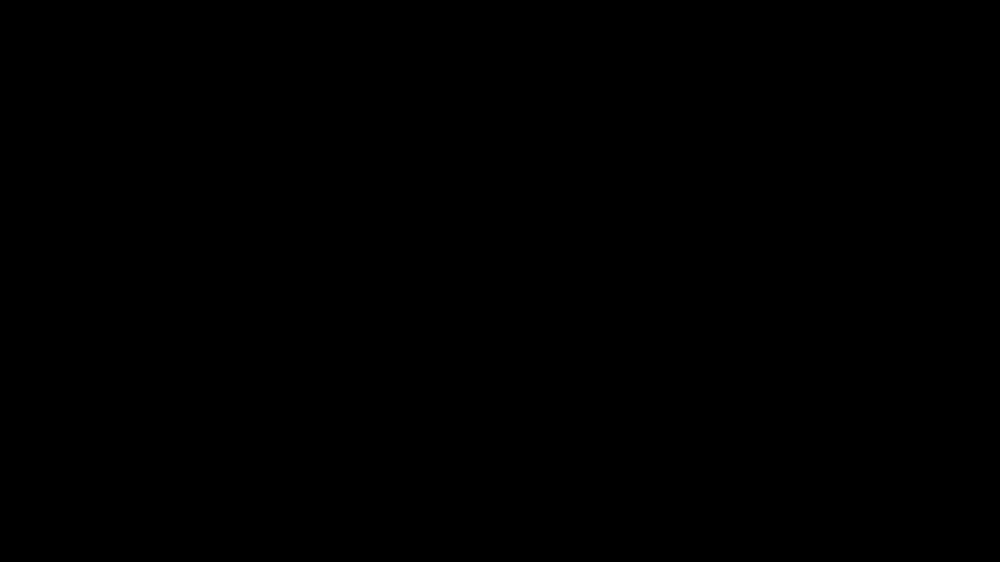

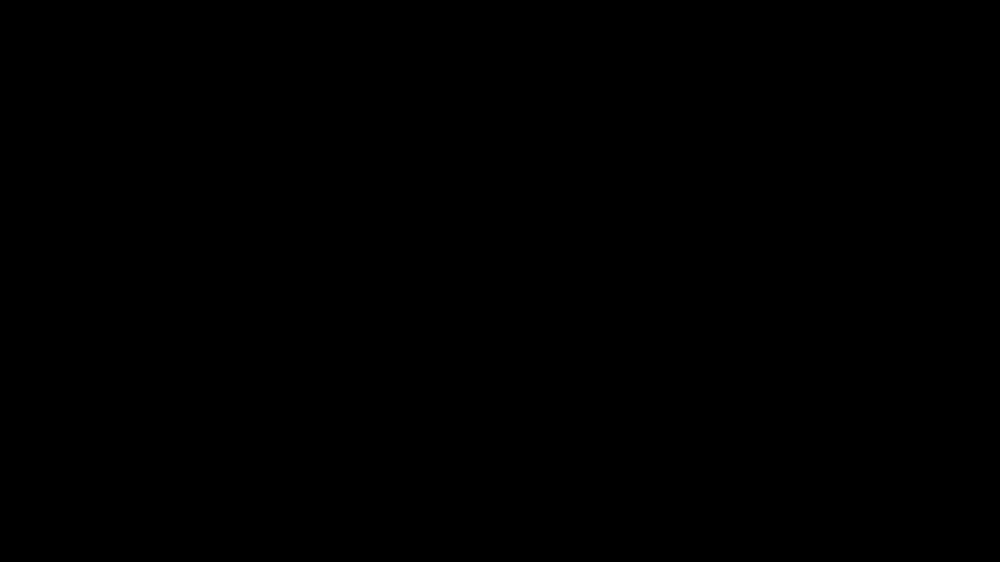

...

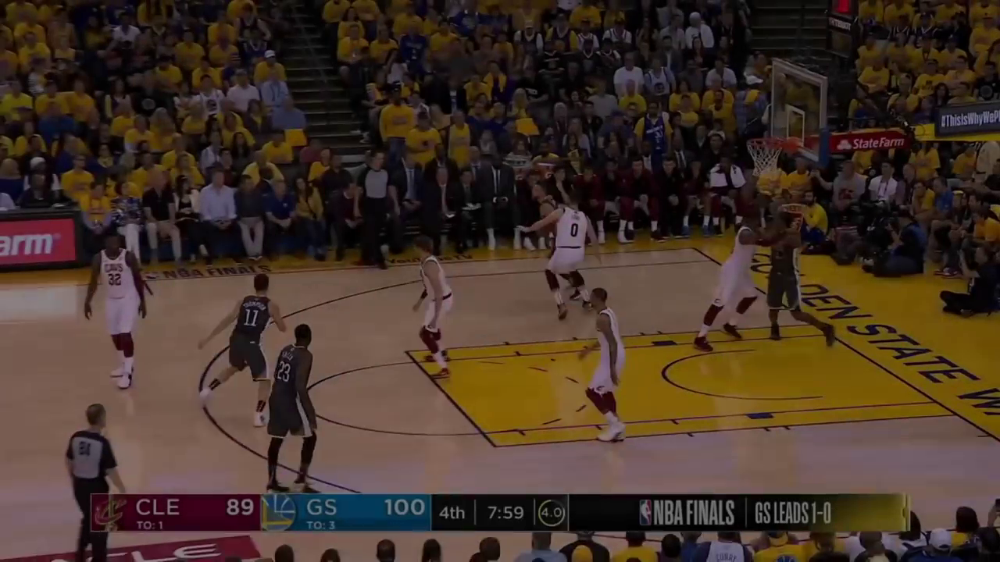

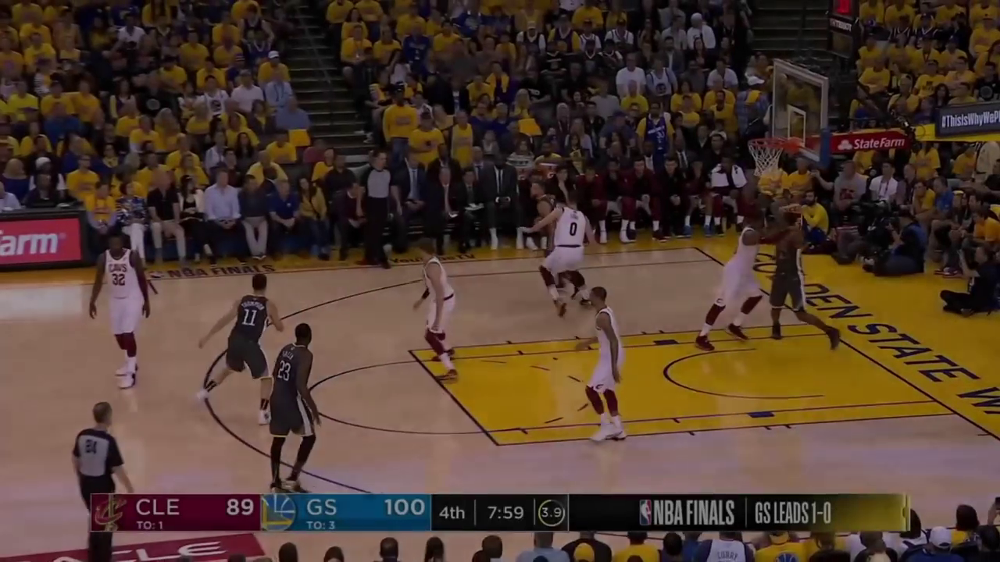

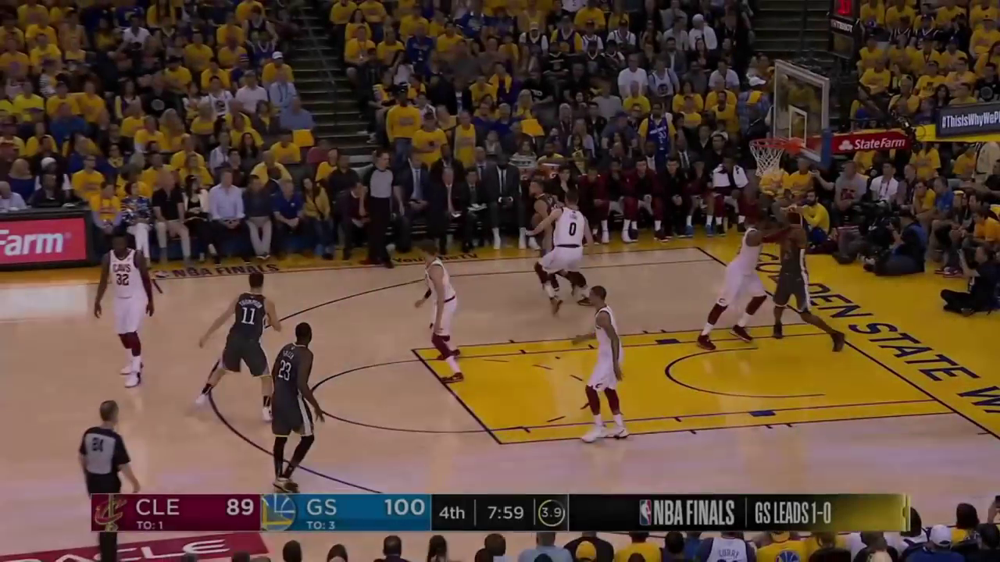

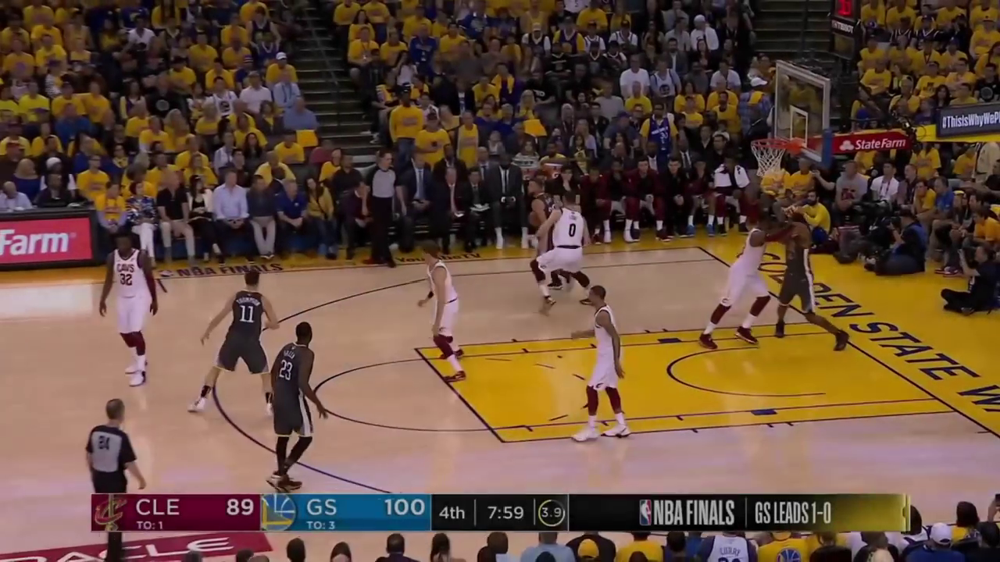

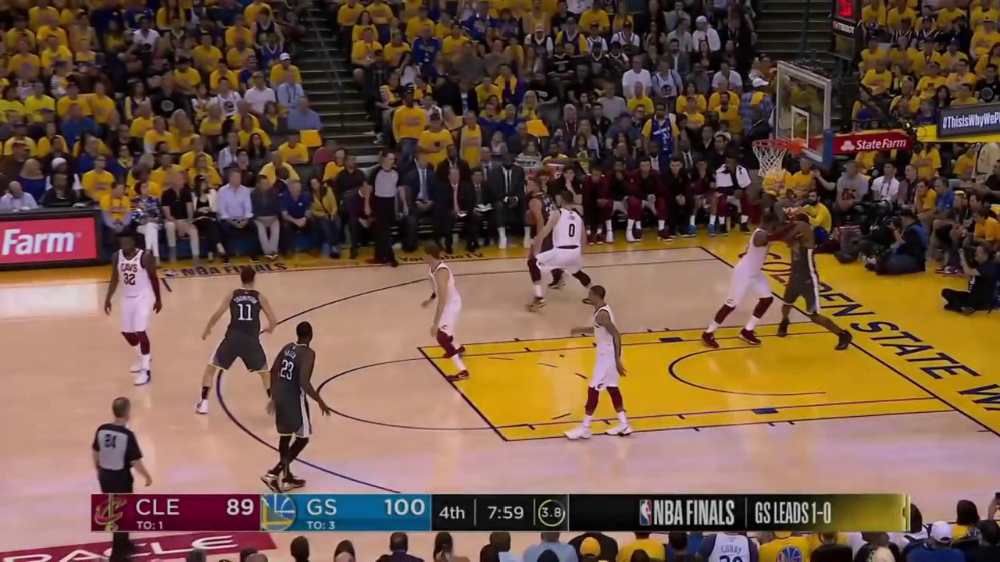

In [ ]:
from detectron2.engine import DefaultPredictor

import os
import pickle

cfg_save_path = "/content/OD_cfg.pickle"

with open(cfg_save_path, 'rb') as f:
  cfg = pickle.load(f)\

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, 'model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

predictor = DefaultPredictor(cfg)

image_path = '/content/test/14.jpg'
videoPath = '/content/test/1.mp4'

on_image(image_path, predictor)
on_video(videoPath, predictor)



